# Start by importing all the packages we need

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!pip install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
!pip install geopy
from geopy.geocoders import Nominatim # module to convert an address into latitude and longitude values
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests

from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!pip install bs4
!pip install folium==0.5.0
import folium # plotting library

print('Libraries imported.')

     |████████████████████████████████| 112kB 6.1MB/s eta 0:00:01
     |████████████████████████████████| 122kB 16.8MB/s eta 0:00:01
  Stored in directory: /home/jupyterlab/.cache/pip/wheels/a0/b0/b2/4f80b9456b87abedbc0bf2d52235414c3467d8889be38dd472
Successfully built bs4
Libraries imported.


# Get Brooklyn Neigborhood data

In [2]:
!wget -q -O 'newyork_data.json' https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/labs/newyork_data.json
print('Downloaded data')

Downloaded data


In [3]:
# Save data into dataframe
with open('newyork_data.json') as json_data:
    newyork_data = json.load(json_data)
    
newyork_data
# Neighborhoods are "Features" in the json file so
neighborhoods_data = newyork_data['features']
neighborhoods_data[0]

# define the dataframe columns
column_names = ['Borough', 'Neighborhood', 'Latitude', 'Longitude'] 

# instantiate the dataframe
neighborhoods = pd.DataFrame(columns=column_names)

for data in neighborhoods_data:
    borough = neighborhood_name = data['properties']['borough'] 
    neighborhood_name = data['properties']['name']
        
    neighborhood_latlon = data['geometry']['coordinates']
    neighborhood_lat = neighborhood_latlon[1]
    neighborhood_lon = neighborhood_latlon[0]
    
    neighborhoods = neighborhoods.append({'Borough': borough,
                                          'Neighborhood': neighborhood_name,
                                          'Latitude': neighborhood_lat,
                                          'Longitude': neighborhood_lon}, ignore_index=True)

In [132]:
neighborhoods.head()

,Neighborhood,Latitude,Longitude
0,Bath Beach,40.599519,-73.998752
1,Bay Ridge,40.625801,-74.030621
2,Bedford,40.687232,-73.941785
3,Bensonhurst,40.611009,-73.995180
4,Bergen Beach,40.615150,-73.898556


In [5]:
data_url = 'https://raw.githubusercontent.com/mona284/Demo2/main/BrooklynData.csv'
neighborhoods = pd.read_csv(data_url)
neighborhoods.head()

,Borough,Neighborhood,Latitude,Longitude
0,Brooklyn,Bath Beach,40.599519,-73.998752
1,Brooklyn,Bay Ridge,40.625801,-74.030621
2,Brooklyn,Bedford,40.687232,-73.941785
3,Brooklyn,Bensonhurst,40.611009,-73.995180
4,Brooklyn,Bergen Beach,40.615150,-73.898556


In [6]:
# Select Brooklyn and delete "Borough" column since it is no longer necessary
brooklyn_data = neighborhoods[neighborhoods['Borough'] == 'Brooklyn'].reset_index(drop=True)
brooklyn_data.sort_values(by =['Neighborhood']) 
del brooklyn_data['Borough']
brooklyn_data.head()

,Neighborhood,Latitude,Longitude
0,Bath Beach,40.599519,-73.998752
1,Bay Ridge,40.625801,-74.030621
2,Bedford,40.687232,-73.941785
3,Bensonhurst,40.611009,-73.995180
4,Bergen Beach,40.615150,-73.898556


In [9]:
data_url = 'https://raw.githubusercontent.com/mona284/Demo2/main/BrooklynData.csv'
neighborhoods = pd.read_csv(data_url)
brooklyn_data = neighborhoods
del brooklyn_data['Borough']
neighborhoods.head()

,Neighborhood,Latitude,Longitude
0,Bath Beach,40.599519,-73.998752
1,Bay Ridge,40.625801,-74.030621
2,Bedford,40.687232,-73.941785
3,Bensonhurst,40.611009,-73.995180
4,Bergen Beach,40.615150,-73.898556


# Get Housing Data

In [10]:
# Get table of housing prices
prices_url= 'https://raw.githubusercontent.com/mona284/Demo2/main/BrooklynHousing.csv'

price_table = pd.read_csv(prices_url)

In [11]:
df_prices = pd.DataFrame(price_table)
df_prices.head()

,Neighborhood,Borough,Median Sale Price
0,Bath Beach,Brooklyn,520000
1,Bay Ridge,Brooklyn,430500
2,Bedford,Brooklyn,773360
3,Bensonhurst,Brooklyn,686555
4,Bergen Beach,Brooklyn,740000


## Add geographical coordinates to housing data

In [14]:
# Combine Neighborhood coordinates with housingp prices
bk_join = pd.merge(brooklyn_data, price_table, how='left', on='Neighborhood')
del bk_join['Borough']

In [15]:
bk_join.head()

,Neighborhood,Latitude,Longitude,Median Sale Price
0,Bath Beach,40.599519,-73.998752,520000.0
1,Bay Ridge,40.625801,-74.030621,430500.0
2,Bedford,40.687232,-73.941785,773360.0
3,Bensonhurst,40.611009,-73.995180,686555.0
4,Bergen Beach,40.615150,-73.898556,740000.0


In [16]:
# Drop neighborhoods without housing information
bk_join.dropna(axis=0, how='any', inplace=True)
bk_join.reset_index(drop=True, inplace=True)
bk_join.shape

(49, 4)

In [17]:
bk_data = bk_join
bk_data.head()

,Neighborhood,Latitude,Longitude,Median Sale Price
0,Bath Beach,40.599519,-73.998752,520000.0
1,Bay Ridge,40.625801,-74.030621,430500.0
2,Bedford,40.687232,-73.941785,773360.0
3,Bensonhurst,40.611009,-73.995180,686555.0
4,Bergen Beach,40.615150,-73.898556,740000.0


## Foursquare stuff

In [18]:
# Credentials
CLIENT_ID = 'UMTH4ZNPTKFXVD2YKIOU1FI3DDGXYD24UEVZFVKEWA4P0E4Q' # your Foursquare ID
CLIENT_SECRET = 'B43BN3GVQTHIXDYYQ5BO11ESWHJ4UPLU0KIWWXJLA5X05Q2Z' # your Foursquare Secret
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: UMTH4ZNPTKFXVD2YKIOU1FI3DDGXYD24UEVZFVKEWA4P0E4Q
CLIENT_SECRET:B43BN3GVQTHIXDYYQ5BO11ESWHJ4UPLU0KIWWXJLA5X05Q2Z


# Get number of schools in each neighborhood

In [19]:
# Gets schools

def getNearbySchools(names, latitudes, longitudes, radius=1500, LIMIT = 100):
    
    cat_Id = '4bf58dd8d48988d13b941735'
    sc_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
 #       print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&categoryId={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION,
            cat_Id,
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
                
        # return only relevant information for each nearby venue
        sc_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_sc = pd.DataFrame([item for sc_list in sc_list for item in sc_list])
    nearby_sc.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_sc)

In [20]:
brooklyn_schools = getNearbySchools(names=bk_data['Neighborhood'],
                                    latitudes=bk_data['Latitude'],
                                    longitudes=bk_data['Longitude']
                                    )
print('Done')

Done


In [21]:
test = brooklyn_schools.groupby(['Neighborhood'], axis=0).count()
bk_num_schools = pd.DataFrame(test['Venue'])
bk_num_schools.rename(columns={"Venue": "Schools"}, inplace=True)
bk_num_schools.head()

,Schools
Neighborhood,
Bath Beach,62
Bay Ridge,43
Bedford,95
Bensonhurst,82
Bergen Beach,8


In [22]:
bk_HouseSchool = pd.merge(bk_data, bk_num_schools, on='Neighborhood')
bk_HouseSchool.head()

,Neighborhood,Latitude,Longitude,Median Sale Price,Schools
0,Bath Beach,40.599519,-73.998752,520000.0,62
1,Bay Ridge,40.625801,-74.030621,430500.0,43
2,Bedford,40.687232,-73.941785,773360.0,95
3,Bensonhurst,40.611009,-73.995180,686555.0,82
4,Bergen Beach,40.615150,-73.898556,740000.0,8


# Get information about parks and outdoor spaces

In [23]:
# Gets Parks, recreation, and outdoor spaces

def getNearbyParks(names, latitudes, longitudes, radius=1500, LIMIT = 100):
    
    search_query = 'Outdoors & Recreation'
    pk_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
#        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&query={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION,
            search_query,
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
                
        # return only relevant information for each nearby venue
        pk_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_pk = pd.DataFrame([item for pk_list in pk_list for item in pk_list])
    nearby_pk.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_pk)

In [24]:
brooklyn_parks = getNearbyParks(names=bk_data['Neighborhood'],
                                latitudes=bk_data['Latitude'],
                                longitudes=bk_data['Longitude']
                                )
print('Done')

Done


In [25]:
test = brooklyn_parks.groupby(['Neighborhood'], axis=0).count()
bk_num_parks = pd.DataFrame(test['Venue'])
bk_num_parks.rename(columns={"Venue": "Parks"}, inplace=True)
bk_num_parks.shape

(40, 1)

In [26]:
bk_HouseSchoolPark = pd.merge(bk_HouseSchool, bk_num_parks, on='Neighborhood')
bk_HouseSchoolPark.head()

,Neighborhood,Latitude,Longitude,Median Sale Price,Schools,Parks
0,Bay Ridge,40.625801,-74.030621,430500.0,43,2
1,Bedford,40.687232,-73.941785,773360.0,95,18
2,Boerum Hill,40.685683,-73.983748,932000.0,100,70
3,Borough Park,40.633131,-73.990498,800000.0,50,1
4,Brighton Beach,40.576825,-73.965094,440000.0,30,5


# Get info about food and grocery stores

In [27]:
# Gets food and drink shops

def getNearbyFood(names, latitudes, longitudes, radius=1500, LIMIT = 500):
    
    cat_Id= '4bf58dd8d48988d1f9941735'
    fd_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
#        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&categoryId={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION,
            cat_Id,
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
                
        # return only relevant information for each nearby venue
        fd_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])
    nearby_fd = pd.DataFrame([item for fd_list in fd_list for item in fd_list])
    nearby_fd.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_fd)

In [28]:
brooklyn_food = getNearbyFood(names=bk_data['Neighborhood'],
                              latitudes=bk_data['Latitude'],
                              longitudes=bk_data['Longitude']
                              )
print('Done')

Done


In [29]:
test = brooklyn_food.groupby(['Neighborhood'], axis=0).count()
bk_num_food = pd.DataFrame(test['Venue'])
bk_num_food.rename(columns={"Venue": "Food"}, inplace=True)
bk_num_food.head()

,Food
Neighborhood,
Bath Beach,60
Bay Ridge,95
Bedford,100
Bensonhurst,100
Bergen Beach,4


In [30]:
brooklyn_food.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,Bath Beach,40.599519,-73.998752,Shan Market,40.589883,-73.991363,Grocery Store
1,Bath Beach,40.599519,-73.998752,Jmart 新世界超市,40.610080,-74.001221,Supermarket
2,Bath Beach,40.599519,-73.998752,Wine Outlet and Liquor,40.609490,-74.005910,Liquor Store
3,Bath Beach,40.599519,-73.998752,21st Ave Grill And Deli,40.603679,-73.995658,Food & Drink Shop
4,Bath Beach,40.599519,-73.998752,Cherry Hill Gourmet Market,40.600723,-73.991912,Gourmet Shop


In [98]:
bk_AllData = pd.merge(bk_HouseSchoolPark, bk_num_food, on='Neighborhood')
bk_AllData.head()

,Neighborhood,Latitude,Longitude,Median Sale Price,Schools,Parks,Food
0,Bay Ridge,40.625801,-74.030621,430500.0,43,2,95
1,Bedford,40.687232,-73.941785,773360.0,95,18,100
2,Boerum Hill,40.685683,-73.983748,932000.0,100,70,100
3,Borough Park,40.633131,-73.990498,800000.0,50,1,92
4,Brighton Beach,40.576825,-73.965094,440000.0,30,5,50


# Now that we have all our data in a dataframe we can start our analysis:

In [36]:
import matplotlib.pyplot as plt

In [37]:
from sklearn import linear_model

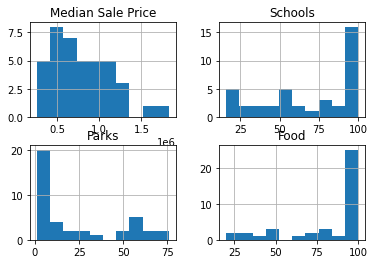

In [41]:
PlotData = bk_AllData[['Neighborhood','Median Sale Price','Schools','Parks','Food']]
PD = PlotData.rename(columns = {'Median Sale Price':'Price'})

viz = PlotData[['Median Sale Price','Schools','Parks','Food']]
viz.hist()
plt.show()

In [39]:
%matplotlib inline
import seaborn as sns

(0.0, 1908676.5)

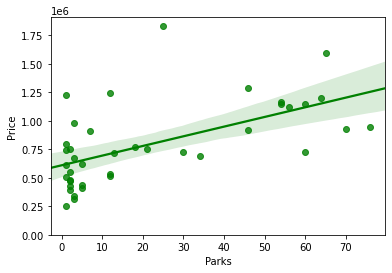

In [32]:
# Parks as potential predictor variable of price
sns.regplot(x="Parks", y="Price", data=PD, color='green')
plt.ylim(0,)

(0.0, 1908676.5)

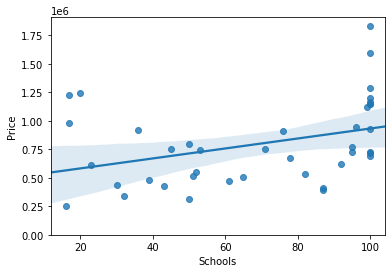

In [33]:
sns.regplot(x="Schools", y="Price", data=PD)
plt.ylim(0,)

(0.0, 1913870.3793250285)

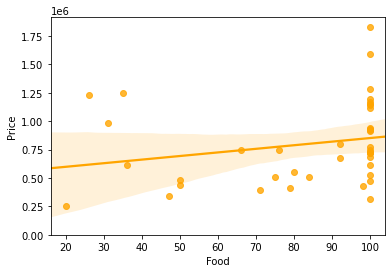

In [34]:
sns.regplot(x="Food", y="Price", data=PD, color='orange')
plt.ylim(0,)

(0.0, 114.63392911266945)

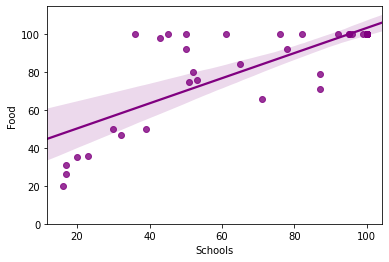

In [66]:
sns.regplot(x="Schools", y="Food", data=PD, color='purple')
plt.ylim(0,)

In [43]:
under8 = PD.loc[PD['Price'] < 800000]
under8.head()

,Neighborhood,Price,Schools,Parks,Food
0,Bay Ridge,430500.0,43,2,95
1,Bedford,773360.0,95,18,100
4,Brighton Beach,440000.0,30,5,50
6,Brownsville,392500.0,86,2,71
7,Bushwick,724000.0,95,30,100


(0.0, 1348548.0014608684)

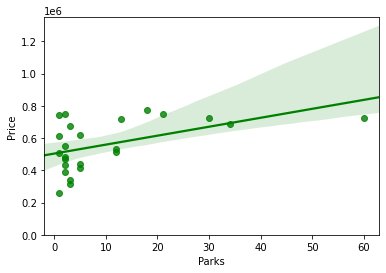

In [56]:
# Parks as potential predictor variable of price
sns.regplot(x="Parks", y="Price", data=under8, color='green')
plt.ylim(0,)

(0.0, 799204.5)

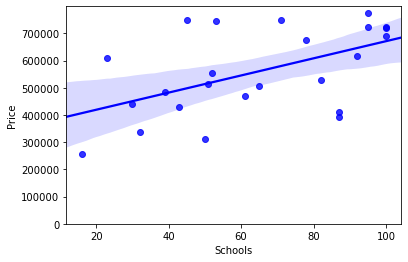

In [57]:
# Schools as potential predictor variable of price
sns.regplot(x="Schools", y="Price", data=under8, color='blue')
plt.ylim(0,)

(0.0, 801021.00794421)

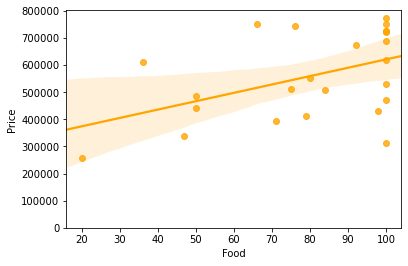

In [58]:
# Food shops as potential predictor variable of price
sns.regplot(x="Food", y="Price", data=under8, color='orange')
plt.ylim(0,)

(0.0, 119.24982866149695)

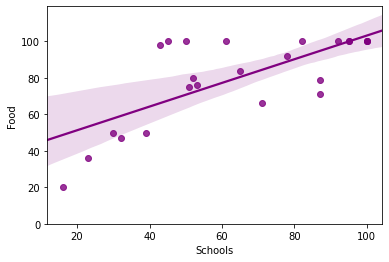

In [61]:
sns.regplot(x="Schools", y="Food", data=under8, color='purple')
plt.ylim(0,)

In [128]:
bk_options = PD[(PD['Price'] <= 800000) &
                (PD['Schools'] > 80) &
               (PD['Food'] > 80) &
               (PD['Parks'] > 20)] 
bk_options

,Neighborhood,Price,Schools,Parks,Food
7,Bushwick,724000.0,95,30,100
9,Clinton Hill,689000.0,100,34,100
13,DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill,725000.0,100,60,100


# Let's try Clustering

In [129]:
PD_clusters = bk_AllData
# run k-means clustering
kclusters = 3
bk_clusters = PD.drop('Neighborhood', 1)
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(bk_clusters)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([1, 0, 0, 0, 1, 2, 1, 0, 2, 0], dtype=int32)

In [100]:
# add clustering labels

PD_AllClusters = PD_clusters.insert(3, 'Cluster Labels', kmeans.labels_)

PD_clusters.head() 

,Neighborhood,Latitude,Longitude,Cluster Labels,Median Sale Price,Schools,Parks,Food
0,Bay Ridge,40.625801,-74.030621,0,430500.0,43,2,95
1,Bedford,40.687232,-73.941785,2,773360.0,95,18,100
2,Boerum Hill,40.685683,-73.983748,4,932000.0,100,70,100
3,Borough Park,40.633131,-73.990498,2,800000.0,50,1,92
4,Brighton Beach,40.576825,-73.965094,0,440000.0,30,5,50


In [140]:
bk_merged.sort_values(by='Cluster Labels')

,Neighborhood,Latitude,Longitude,Cluster Labels,Median Sale Price,Schools,Parks,Food
39,Windsor Terrace,40.656946,-73.980073,0,750000.0,71,21,66
38,Williamsburg,40.707144,-73.958115,0,941881.0,96,76,100
17,Flatbush,40.636326,-73.958401,0,675000.0,78,3,92
27,Madison,40.609378,-73.948415,0,745188.0,53,1,76
15,Dyker Heights,40.619219,-74.019314,0,750000.0,45,2,99
28,Manhattan Beach,40.577914,-73.943537,0,983500.0,17,3,31
13,DUMBO-Vinegar Hill-Downtown Brooklyn-Boerum Hill,40.690844,-73.983463,0,725000.0,100,60,100
12,Ditmas Park,40.643675,-73.961013,0,910000.0,76,7,100
24,Greenpoint,40.730201,-73.954241,0,920000.0,36,46,100
11,Crown Heights,40.670829,-73.943291,0,720000.0,100,13,100


## Visualize the clusters

# Create a Map of Brooklyn

In [69]:
# !wget -q -O 'new-york.geojson' https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON
# The wget command wasnt't working so I downliaded with urllib.request

import urllib.request

print('Beginning file download with urllib2...')

Beginning file download with urllib2...


In [70]:
url = 'https://data.cityofnewyork.us/api/geospatial/cpf4-rkhq?method=export&format=GeoJSON'
urllib.request.urlretrieve(url, 'new-york.geojson')


print('Data downloaded!')
ny_geo = r'new-york.geojson'

Data downloaded!


In [118]:
# Brooklyn latitude and longitude values
latitude = 40.65
longitude = -73.94

bk_geo = r'new-york.geojson'

bk_map = folium.Map(location=[latitude, longitude], zoom_start=12)

bk_map.choropleth(
    geo_data=bk_geo,
    data=bk_data,
    columns=['Neighborhood', 'Median Sale Price'],
    key_on='feature.properties.ntaname',
    fill_color='YlOrRd', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Cost of Housing in Brooklyn',
    reset=True
)

for lat, lng, price, neighborhood in zip(bk_AllData['Latitude'], bk_AllData['Longitude'], bk_AllData['Median Sale Price'], bk_AllData['Neighborhood']):
    label = '{}, {}'.format(neighborhood, int(price))
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(bk_map)  

bk_map

In [124]:
bk_parks = folium.Map(location=[latitude, longitude], zoom_start=12)

bk_parks.choropleth(
    geo_data=bk_geo,
    data=bk_AllData,
    columns=['Neighborhood', 'Parks'],
    key_on='feature.properties.ntaname',
    fill_color='YlGn', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Outdoor Spaces in Brooklyn',
    reset=True
)

for lat, lng, parks, neighborhood in zip(bk_AllData['Latitude'], bk_AllData['Longitude'], bk_AllData['Parks'], bk_AllData['Neighborhood']):
    label = '{}, {}'.format(neighborhood, parks)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(bk_parks)  

bk_parks

In [125]:
bk_schools = folium.Map(location=[latitude, longitude], zoom_start=12)

bk_schools.choropleth(
    geo_data=bk_geo,
    data=bk_AllData,
    columns=['Neighborhood', 'Schools'],
    key_on='feature.properties.ntaname',
    fill_color='BuPu', 
    fill_opacity=0.7, 
    line_opacity=0.2,
    legend_name='Schools in Brooklyn',
    reset=True
)

for lat, lng, schools, neighborhood in zip(bk_AllData['Latitude'], bk_AllData['Longitude'], bk_AllData['Schools'], bk_AllData['Neighborhood']):
    label = '{}, {}'.format(neighborhood, schools)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(bk_schools)  

bk_schools